In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
# Helper libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import tensorflow_datasets as tfds
import os
import PIL
import PIL.Image
import keras
import gc

In [ ]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
os.chdir("/content/gdrive/MyDrive/Saved images")
!pwd

/content/gdrive/MyDrive/Saved images


In [ ]:
#unzips the zip file
"""
import zipfile
import os

zip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
zip_ref.close()
"""

"\nimport zipfile\nimport os\n\nzip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')\nzip_ref.extractall('/tmp') #Extracts the files into the /tmp folder\nzip_ref.close()\n"

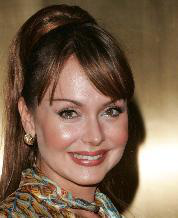

In [ ]:
filePath = "/content/gdrive/MyDrive/celeba"
sampleImage = PIL.Image.open("/tmp/img_align_celeba/000009.jpg")
sampleImage

In [ ]:
dataset = tf.data.Dataset.list_files('/tmp/img_align_celeba/*.jpg', shuffle=True)
image_count = len(os.listdir('/tmp/img_align_celeba/'))

scale = 1.0
dataset = dataset.take(int(image_count * scale))
val_size = int(image_count * scale * 0.1)
trainData = dataset.skip(int(val_size))
valData = dataset.take(val_size)
print(tf.data.experimental.cardinality(trainData).numpy())
print(tf.data.experimental.cardinality(valData).numpy())

182340
20259


In [ ]:
def decode_img(file_path):
  img = tf.io.read_file(file_path)
  # convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  img = tf.image.crop_to_bounding_box(img, 20, 0, 178, 178)
  #img = tf.image.rgb_to_grayscale(img)
  img = img / 255
  # resize the image to the desired size
  return tf.image.resize(img, [96, 96])

trainData = trainData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
valData = valData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)

Image shape:  (96, 96, 3)


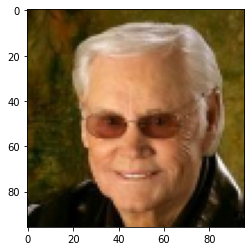

In [ ]:
for image in trainData.take(1):
  plt.imshow(image.numpy())
  #print(image)
  print("Image shape: ", image.numpy().shape)

In [ ]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = '/content/drive/My Drive/projects/faces'
EPOCHS = 50
BATCH_SIZE = 64
BUFFER_SIZE = 60000

In [ ]:
batchSize = BATCH_SIZE
#trainData = trainData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
#valData = valData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
trainData = trainData.batch(batchSize)
valData = valData.batch(batchSize)

In [ ]:
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam

init = tf.keras.initializers.HeNormal
regularizer = None #tf.keras.regularizers.L2(0.002)
interpolation = "nearest"
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size, kernel_initializer = init))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D(interpolation = interpolation))
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D(interpolation = interpolation))
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D(interpolation = interpolation))
    model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
      model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES), interpolation = interpolation))
      model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))

    #New layers
    model.add(Conv2D(64,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("sigmoid"))

    return model


def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.3))
    model.add(Conv2D(64, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.3))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.3))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.3))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(1, activation='linear'))

    return model

(1, 96, 96, 3)


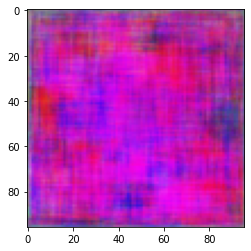

In [ ]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)
#generator = keras.models.load_model("/content/gdrive/MyDrive/generator-VLSGAN", compile=False)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

#print(generated_image)
plt.imshow(generated_image[0])
#plt.savefig("generatedImage")
print(generated_image.shape)

In [ ]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
#discriminator = keras.models.load_model("/content/gdrive/MyDrive/discriminator-VLSGAN", compile=False)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.4171784]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
mse = tf.keras.losses.MeanSquaredError()

def discriminator_loss(real_output, fake_output):
  real_loss = mse(tf.ones_like(real_output), real_output)
  fake_loss = mse(tf.zeros_like(fake_output), fake_output)
  loss = real_loss + fake_loss
  return loss
  
def generator_loss(fake_output):
    return mse(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(0.0001,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(0.0001,0.5)

In [ ]:
@tf.function
def train_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return gen_loss,disc_loss

In [ ]:
@tf.function
def val_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  generated_images = generator(seed, training=False)

  real_output = discriminator(images, training=False)
  fake_output = discriminator(generated_images, training=False)

  return real_output,fake_output

800
tf.Tensor(1.452991, shape=(), dtype=float32) tf.Tensor(1.8252645, shape=(), dtype=float32)


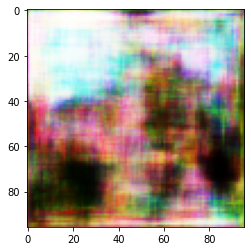

1600
tf.Tensor(1.1412221, shape=(), dtype=float32) tf.Tensor(1.4122043, shape=(), dtype=float32)


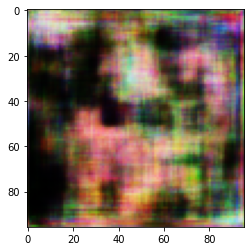

2400
tf.Tensor(0.96993023, shape=(), dtype=float32) tf.Tensor(1.2151133, shape=(), dtype=float32)


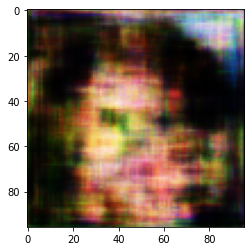

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 1, gen loss=0.9049753546714783,disc loss=1.1395487785339355,
Accuracy:  0.5630830741892492
Accuracy on fake:  0.18609013278049263
800
tf.Tensor(0.5407387, shape=(), dtype=float32) tf.Tensor(0.6918144, shape=(), dtype=float32)


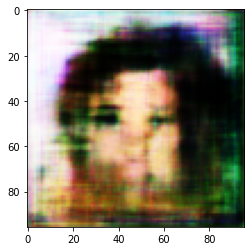

1600
tf.Tensor(0.5265959, shape=(), dtype=float32) tf.Tensor(0.62169695, shape=(), dtype=float32)


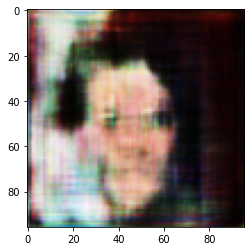

2400
tf.Tensor(0.5253854, shape=(), dtype=float32) tf.Tensor(0.59319603, shape=(), dtype=float32)


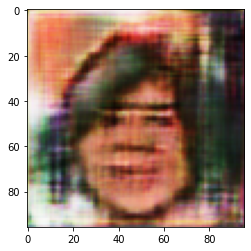

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 2, gen loss=0.5187802314758301,disc loss=0.578172504901886,
Accuracy:  0.5303568784244039
Accuracy on fake:  0.1325336887309344
800
tf.Tensor(0.46988463, shape=(), dtype=float32) tf.Tensor(0.52556574, shape=(), dtype=float32)


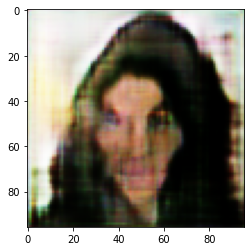

1600
tf.Tensor(0.4709124, shape=(), dtype=float32) tf.Tensor(0.5265949, shape=(), dtype=float32)


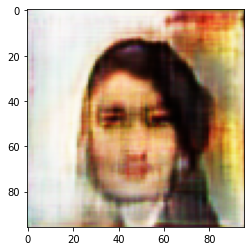

2400
tf.Tensor(0.47878978, shape=(), dtype=float32) tf.Tensor(0.52393234, shape=(), dtype=float32)


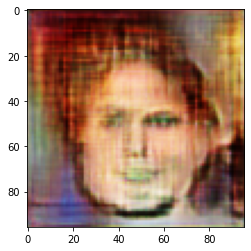

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 3, gen loss=0.47825366258621216,disc loss=0.5187349915504456,
Accuracy:  0.5009872155585172
Accuracy on fake:  0.9844019941754282
800
tf.Tensor(0.46588424, shape=(), dtype=float32) tf.Tensor(0.5165655, shape=(), dtype=float32)


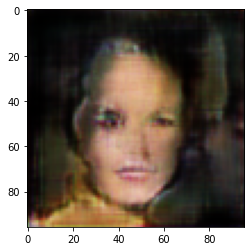

1600
tf.Tensor(0.4676976, shape=(), dtype=float32) tf.Tensor(0.51770425, shape=(), dtype=float32)


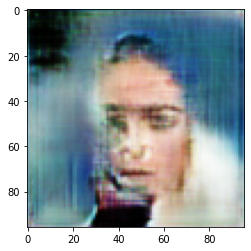

2400
tf.Tensor(0.46765706, shape=(), dtype=float32) tf.Tensor(0.51986885, shape=(), dtype=float32)


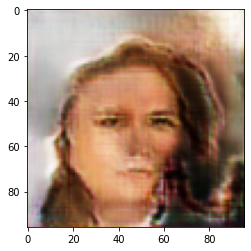

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 4, gen loss=0.4688624441623688,disc loss=0.519767165184021,
Accuracy:  0.7401895453872352
Accuracy on fake:  0.9056221926057555
800
tf.Tensor(0.46422577, shape=(), dtype=float32) tf.Tensor(0.5033692, shape=(), dtype=float32)


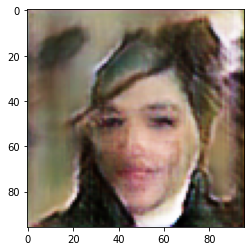

1600
tf.Tensor(0.47049356, shape=(), dtype=float32) tf.Tensor(0.5103589, shape=(), dtype=float32)


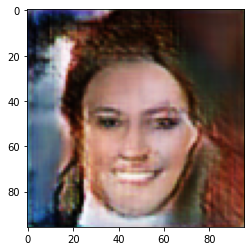

2400
tf.Tensor(0.472963, shape=(), dtype=float32) tf.Tensor(0.5123462, shape=(), dtype=float32)


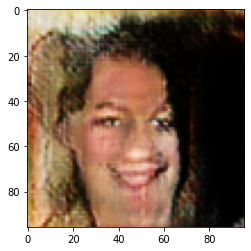

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 5, gen loss=0.4730735123157501,disc loss=0.5088164806365967,
Accuracy:  0.6513154647317242
Accuracy on fake:  0.3983414778616911
800
tf.Tensor(0.4952548, shape=(), dtype=float32) tf.Tensor(0.4882216, shape=(), dtype=float32)


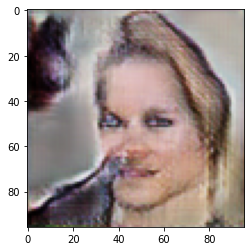

1600
tf.Tensor(0.49318323, shape=(), dtype=float32) tf.Tensor(0.48876026, shape=(), dtype=float32)


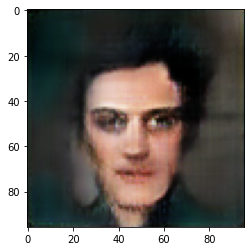

2400
tf.Tensor(0.4843902, shape=(), dtype=float32) tf.Tensor(0.4957843, shape=(), dtype=float32)


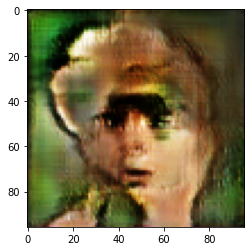

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 6, gen loss=0.48124486207962036,disc loss=0.497129887342453,
Accuracy:  0.5735475591095316
Accuracy on fake:  0.2030702403869885
800
tf.Tensor(0.4564625, shape=(), dtype=float32) tf.Tensor(0.51648515, shape=(), dtype=float32)


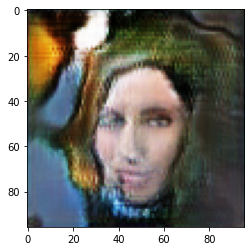

1600
tf.Tensor(0.46172222, shape=(), dtype=float32) tf.Tensor(0.5125333, shape=(), dtype=float32)


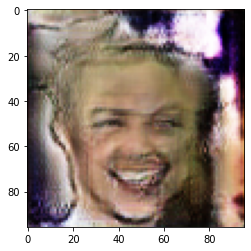

2400
tf.Tensor(0.4590311, shape=(), dtype=float32) tf.Tensor(0.51199156, shape=(), dtype=float32)


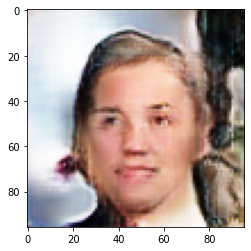

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 7, gen loss=0.4586338698863983,disc loss=0.5097929835319519,
Accuracy:  0.6316698751172318
Accuracy on fake:  0.36517103509551313
800
tf.Tensor(0.46577615, shape=(), dtype=float32) tf.Tensor(0.49997762, shape=(), dtype=float32)


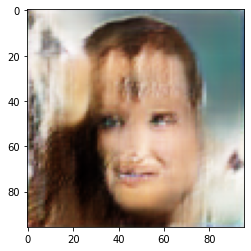

1600
tf.Tensor(0.46141735, shape=(), dtype=float32) tf.Tensor(0.49517033, shape=(), dtype=float32)


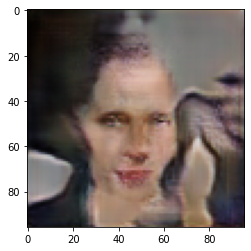

2400
tf.Tensor(0.46323043, shape=(), dtype=float32) tf.Tensor(0.4974759, shape=(), dtype=float32)


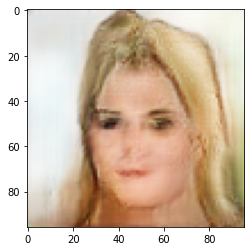

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 8, gen loss=0.46303942799568176,disc loss=0.5026976466178894,
Accuracy:  0.49995063922207417
Accuracy on fake:  0.0188064563897527
800
tf.Tensor(0.45390278, shape=(), dtype=float32) tf.Tensor(0.49220476, shape=(), dtype=float32)


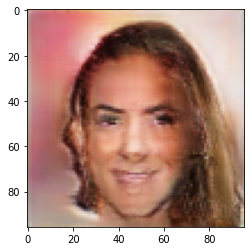

1600
tf.Tensor(0.45496455, shape=(), dtype=float32) tf.Tensor(0.4962549, shape=(), dtype=float32)


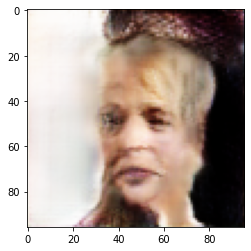

2400
tf.Tensor(0.45524505, shape=(), dtype=float32) tf.Tensor(0.5004667, shape=(), dtype=float32)


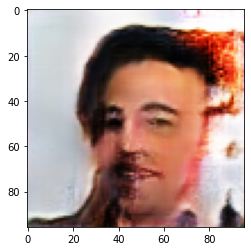

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 9, gen loss=0.4533911943435669,disc loss=0.4998878240585327,
Accuracy:  0.6104694209980749
Accuracy on fake:  0.2962633891110124
800
tf.Tensor(0.4568079, shape=(), dtype=float32) tf.Tensor(0.5070016, shape=(), dtype=float32)


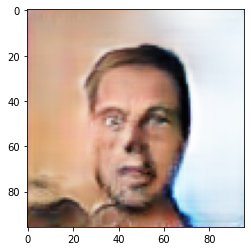

1600
tf.Tensor(0.4639765, shape=(), dtype=float32) tf.Tensor(0.49220604, shape=(), dtype=float32)


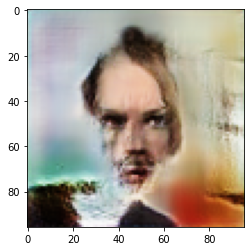

2400
tf.Tensor(0.45886388, shape=(), dtype=float32) tf.Tensor(0.49009317, shape=(), dtype=float32)


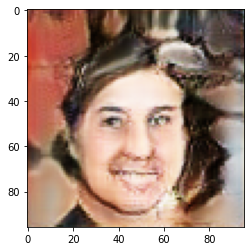

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 10, gen loss=0.4592796266078949,disc loss=0.4895883798599243,
Accuracy:  0.7194333382694111
Accuracy on fake:  0.6300903302236043
800
tf.Tensor(0.47250137, shape=(), dtype=float32) tf.Tensor(0.48168036, shape=(), dtype=float32)


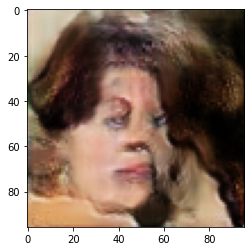

1600
tf.Tensor(0.46064633, shape=(), dtype=float32) tf.Tensor(0.48719203, shape=(), dtype=float32)


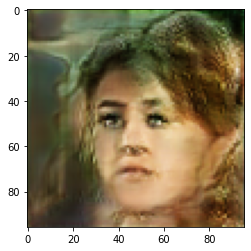

2400
tf.Tensor(0.46112105, shape=(), dtype=float32) tf.Tensor(0.484717, shape=(), dtype=float32)


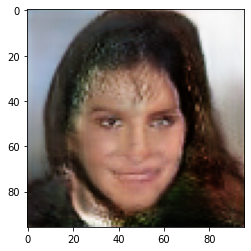

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 11, gen loss=0.45731455087661743,disc loss=0.48470914363861084,
Accuracy:  0.6116293992793327
Accuracy on fake:  0.2910805074287971
800
tf.Tensor(0.45086956, shape=(), dtype=float32) tf.Tensor(0.4812772, shape=(), dtype=float32)


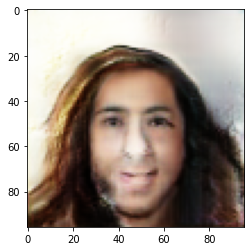

1600
tf.Tensor(0.44414374, shape=(), dtype=float32) tf.Tensor(0.48224327, shape=(), dtype=float32)


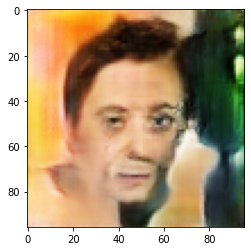

2400
tf.Tensor(0.44649202, shape=(), dtype=float32) tf.Tensor(0.4810196, shape=(), dtype=float32)


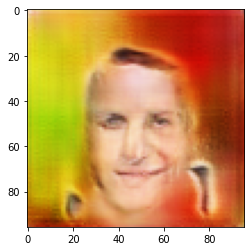

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 12, gen loss=0.4448069632053375,disc loss=0.4812239110469818,
Accuracy:  0.6178982180759168
Accuracy on fake:  0.29048817809368677
800
tf.Tensor(0.45471692, shape=(), dtype=float32) tf.Tensor(0.46920016, shape=(), dtype=float32)


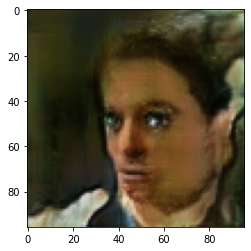

1600
tf.Tensor(0.44392166, shape=(), dtype=float32) tf.Tensor(0.47196212, shape=(), dtype=float32)


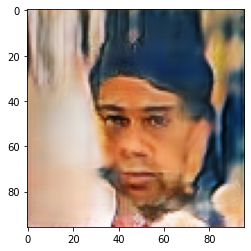

2400
tf.Tensor(0.44141647, shape=(), dtype=float32) tf.Tensor(0.46929383, shape=(), dtype=float32)


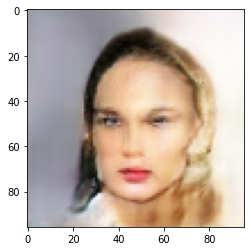

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 13, gen loss=0.4413684606552124,disc loss=0.4697595536708832,
Accuracy:  0.5195715484476036
Accuracy on fake:  0.05597512216792536
800
tf.Tensor(0.44151837, shape=(), dtype=float32) tf.Tensor(0.45798495, shape=(), dtype=float32)


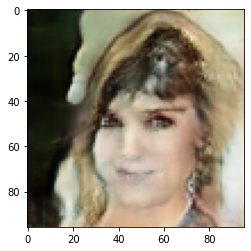

1600
tf.Tensor(0.43471447, shape=(), dtype=float32) tf.Tensor(0.458037, shape=(), dtype=float32)


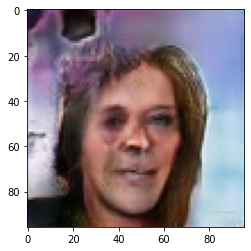

2400
tf.Tensor(0.43547592, shape=(), dtype=float32) tf.Tensor(0.4568486, shape=(), dtype=float32)


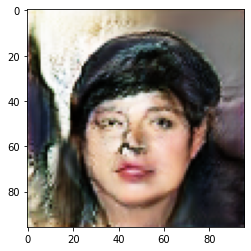

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 14, gen loss=0.43423107266426086,disc loss=0.4549577236175537,
Accuracy:  0.742040574559455
Accuracy on fake:  0.5785083172910805
800
tf.Tensor(0.42890385, shape=(), dtype=float32) tf.Tensor(0.45562008, shape=(), dtype=float32)


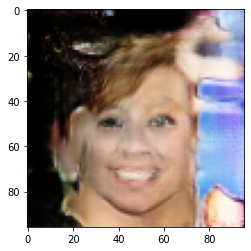

1600
tf.Tensor(0.43078232, shape=(), dtype=float32) tf.Tensor(0.44838578, shape=(), dtype=float32)


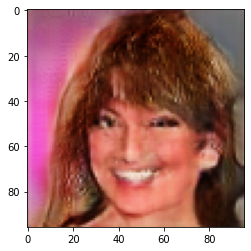

2400
tf.Tensor(0.42609224, shape=(), dtype=float32) tf.Tensor(0.44650203, shape=(), dtype=float32)


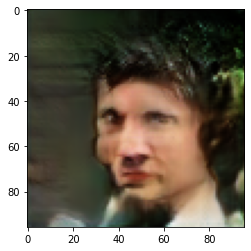

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 15, gen loss=0.42474809288978577,disc loss=0.44749245047569275,
Accuracy:  0.5030850486203663
Accuracy on fake:  0.011698504368428847
800
tf.Tensor(0.41643986, shape=(), dtype=float32) tf.Tensor(0.44815484, shape=(), dtype=float32)


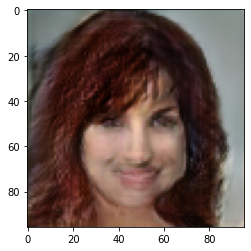

1600
tf.Tensor(0.417819, shape=(), dtype=float32) tf.Tensor(0.44431454, shape=(), dtype=float32)


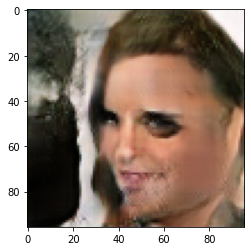

2400
tf.Tensor(0.4195754, shape=(), dtype=float32) tf.Tensor(0.44057873, shape=(), dtype=float32)


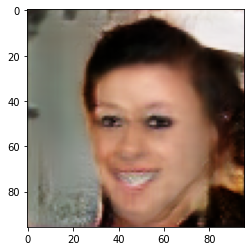

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 16, gen loss=0.4199523627758026,disc loss=0.43927714228630066,
Accuracy:  0.6438126264869934
Accuracy on fake:  0.973542623031739
800
tf.Tensor(0.41705504, shape=(), dtype=float32) tf.Tensor(0.43770504, shape=(), dtype=float32)


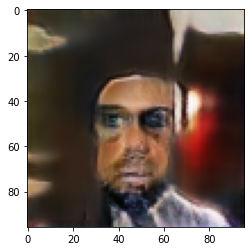

1600
tf.Tensor(0.4226261, shape=(), dtype=float32) tf.Tensor(0.43408948, shape=(), dtype=float32)


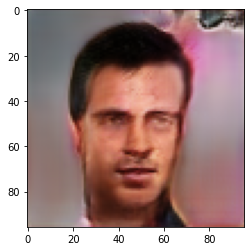

2400
tf.Tensor(0.4231627, shape=(), dtype=float32) tf.Tensor(0.43346152, shape=(), dtype=float32)


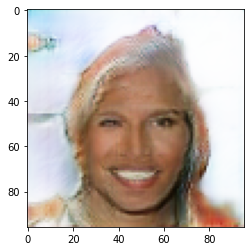

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 17, gen loss=0.4235023558139801,disc loss=0.4333478510379791,
Accuracy:  0.5093291870279876
Accuracy on fake:  0.020928969840564686
800
tf.Tensor(0.41297272, shape=(), dtype=float32) tf.Tensor(0.43519402, shape=(), dtype=float32)


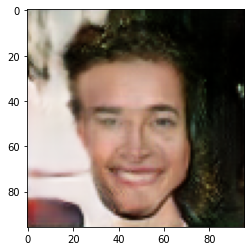

1600
tf.Tensor(0.42233527, shape=(), dtype=float32) tf.Tensor(0.43273246, shape=(), dtype=float32)


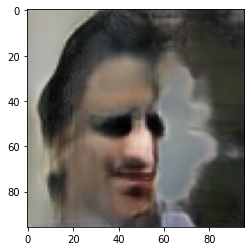

2400
tf.Tensor(0.4233638, shape=(), dtype=float32) tf.Tensor(0.42994583, shape=(), dtype=float32)


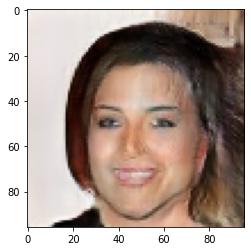

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 18, gen loss=0.4220758080482483,disc loss=0.43000656366348267,
Accuracy:  0.5967964855126117
Accuracy on fake:  0.2062786909521694
800
tf.Tensor(0.4224084, shape=(), dtype=float32) tf.Tensor(0.43337846, shape=(), dtype=float32)


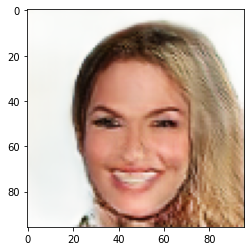

1600
tf.Tensor(0.4226201, shape=(), dtype=float32) tf.Tensor(0.4291855, shape=(), dtype=float32)


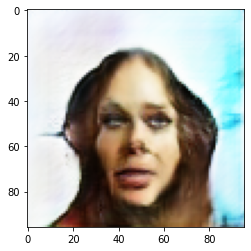

2400
tf.Tensor(0.423622, shape=(), dtype=float32) tf.Tensor(0.42705318, shape=(), dtype=float32)


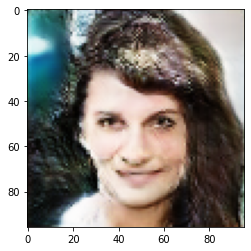

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 19, gen loss=0.42402228713035583,disc loss=0.42669394612312317,
Accuracy:  0.7047485068364677
Accuracy on fake:  0.5502739523174885
800
tf.Tensor(0.42088786, shape=(), dtype=float32) tf.Tensor(0.42651993, shape=(), dtype=float32)


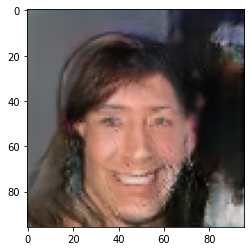

1600
tf.Tensor(0.42261475, shape=(), dtype=float32) tf.Tensor(0.4254148, shape=(), dtype=float32)


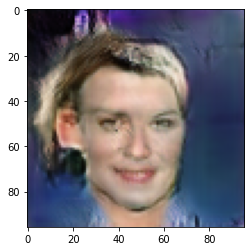

2400
tf.Tensor(0.42272156, shape=(), dtype=float32) tf.Tensor(0.42405897, shape=(), dtype=float32)


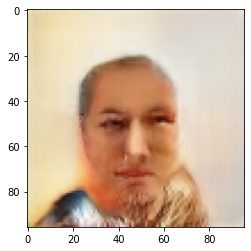

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 20, gen loss=0.4244506061077118,disc loss=0.42491620779037476,
Accuracy:  0.5057998914062886
Accuracy on fake:  0.015795448936275235
800
tf.Tensor(0.4043563, shape=(), dtype=float32) tf.Tensor(0.45039773, shape=(), dtype=float32)


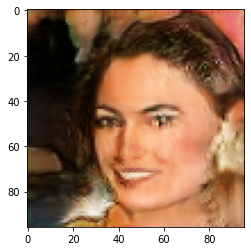

1600
tf.Tensor(0.4104398, shape=(), dtype=float32) tf.Tensor(0.43778488, shape=(), dtype=float32)


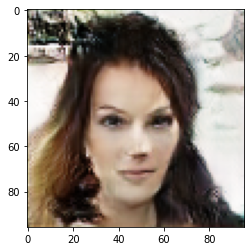

2400
tf.Tensor(0.4138442, shape=(), dtype=float32) tf.Tensor(0.43352655, shape=(), dtype=float32)


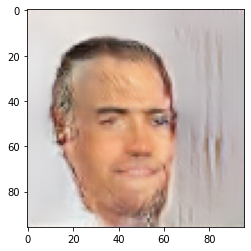

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 21, gen loss=0.41461044549942017,disc loss=0.43257537484169006,
Accuracy:  0.5803099856853744
Accuracy on fake:  0.8660842094871415
800
tf.Tensor(0.42069024, shape=(), dtype=float32) tf.Tensor(0.42885, shape=(), dtype=float32)


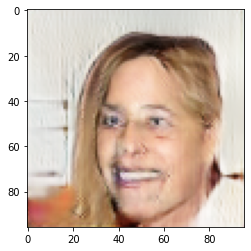

1600
tf.Tensor(0.42107895, shape=(), dtype=float32) tf.Tensor(0.4258806, shape=(), dtype=float32)


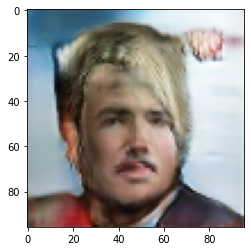

2400
tf.Tensor(0.4257041, shape=(), dtype=float32) tf.Tensor(0.42446822, shape=(), dtype=float32)


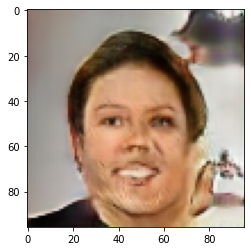

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 22, gen loss=0.42567452788352966,disc loss=0.42337432503700256,
Accuracy:  0.6482797768892837
Accuracy on fake:  0.3154153709462461
800
tf.Tensor(0.43207428, shape=(), dtype=float32) tf.Tensor(0.4166169, shape=(), dtype=float32)


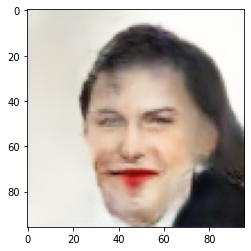

1600
tf.Tensor(0.4344384, shape=(), dtype=float32) tf.Tensor(0.41490462, shape=(), dtype=float32)


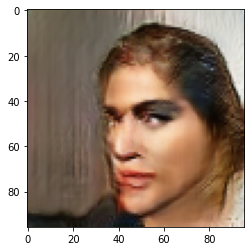

2400
tf.Tensor(0.4325525, shape=(), dtype=float32) tf.Tensor(0.41548124, shape=(), dtype=float32)


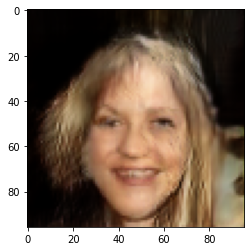

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 23, gen loss=0.4333169162273407,disc loss=0.4160462021827698,
Accuracy:  0.6414433091465521
Accuracy on fake:  0.9875117231847574
800
tf.Tensor(0.42595288, shape=(), dtype=float32) tf.Tensor(0.41842118, shape=(), dtype=float32)


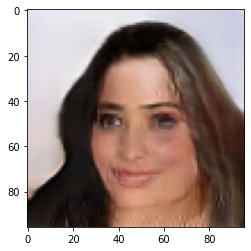

1600
tf.Tensor(0.42416847, shape=(), dtype=float32) tf.Tensor(0.41999704, shape=(), dtype=float32)


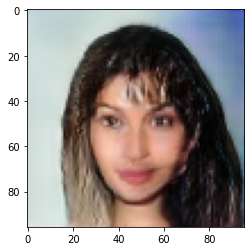

2400
tf.Tensor(0.42652586, shape=(), dtype=float32) tf.Tensor(0.41897756, shape=(), dtype=float32)


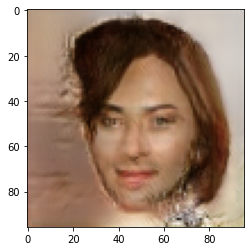

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 24, gen loss=0.42699891328811646,disc loss=0.41922834515571594,
Accuracy:  0.769583888642085
Accuracy on fake:  0.5993385655757935
800
tf.Tensor(0.43170425, shape=(), dtype=float32) tf.Tensor(0.41572994, shape=(), dtype=float32)


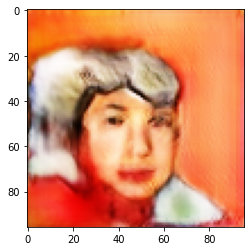

1600
tf.Tensor(0.43318364, shape=(), dtype=float32) tf.Tensor(0.41611683, shape=(), dtype=float32)


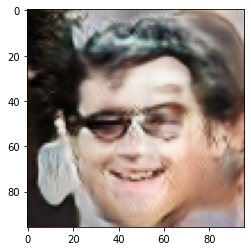

2400
tf.Tensor(0.43525726, shape=(), dtype=float32) tf.Tensor(0.4138318, shape=(), dtype=float32)


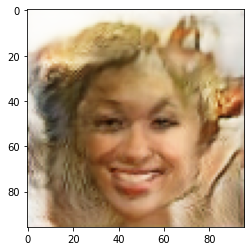

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 25, gen loss=0.43504682183265686,disc loss=0.4146886467933655,
Accuracy:  0.6145910459548842
Accuracy on fake:  0.3162545041709857
800
tf.Tensor(0.4245732, shape=(), dtype=float32) tf.Tensor(0.42784026, shape=(), dtype=float32)


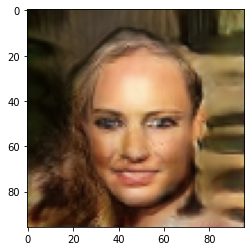

1600
tf.Tensor(0.42761764, shape=(), dtype=float32) tf.Tensor(0.42034763, shape=(), dtype=float32)


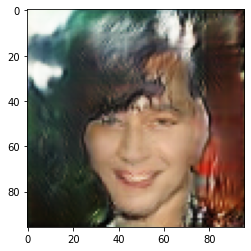

2400
tf.Tensor(0.42951837, shape=(), dtype=float32) tf.Tensor(0.417553, shape=(), dtype=float32)


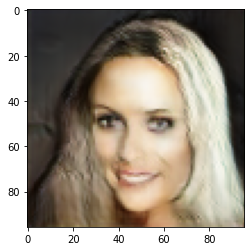

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 26, gen loss=0.43149301409721375,disc loss=0.4165663421154022,
Accuracy:  0.6017572436941606
Accuracy on fake:  0.213485364529345
800
tf.Tensor(0.4327856, shape=(), dtype=float32) tf.Tensor(0.41382045, shape=(), dtype=float32)


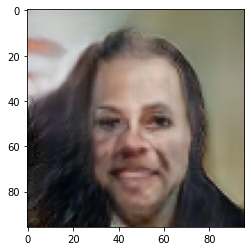

1600
tf.Tensor(0.43491614, shape=(), dtype=float32) tf.Tensor(0.4114815, shape=(), dtype=float32)


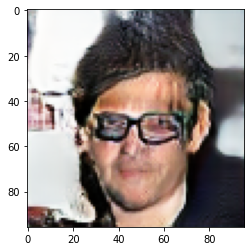

2400
tf.Tensor(0.436411, shape=(), dtype=float32) tf.Tensor(0.4104907, shape=(), dtype=float32)


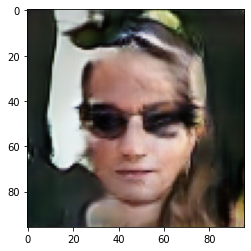

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 27, gen loss=0.43771326541900635,disc loss=0.410061240196228,
Accuracy:  0.6821659509353868
Accuracy on fake:  0.754726294486401
800
tf.Tensor(0.4313245, shape=(), dtype=float32) tf.Tensor(0.4205284, shape=(), dtype=float32)


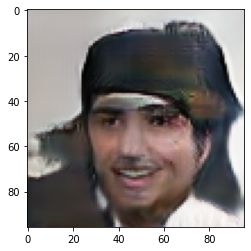

1600
tf.Tensor(0.438443, shape=(), dtype=float32) tf.Tensor(0.41058347, shape=(), dtype=float32)


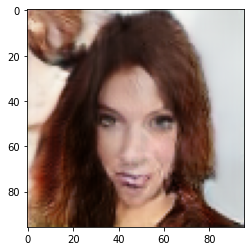

2400
tf.Tensor(0.44103628, shape=(), dtype=float32) tf.Tensor(0.4085526, shape=(), dtype=float32)


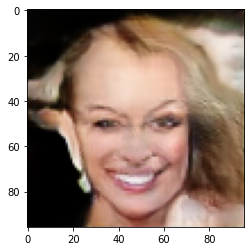

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 28, gen loss=0.4416145980358124,disc loss=0.40789639949798584,
Accuracy:  0.5421294239597216
Accuracy on fake:  0.10661928031985785
800
tf.Tensor(0.44706276, shape=(), dtype=float32) tf.Tensor(0.41186208, shape=(), dtype=float32)


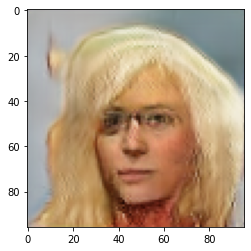

1600
tf.Tensor(0.45141742, shape=(), dtype=float32) tf.Tensor(0.40385655, shape=(), dtype=float32)


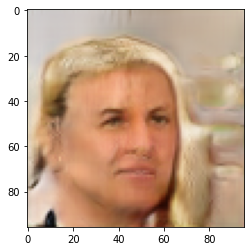

2400
tf.Tensor(0.45126113, shape=(), dtype=float32) tf.Tensor(0.40362358, shape=(), dtype=float32)


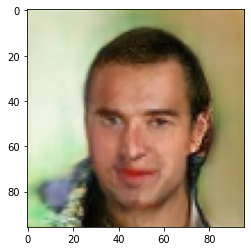

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 29, gen loss=0.45169442892074585,disc loss=0.4147915840148926,
Accuracy:  0.5212991756750086
Accuracy on fake:  0.17740263586554125
800
tf.Tensor(0.39808926, shape=(), dtype=float32) tf.Tensor(0.5175305, shape=(), dtype=float32)


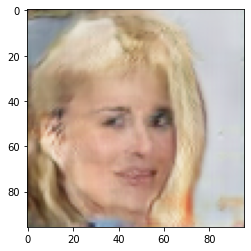

1600
tf.Tensor(0.3976977, shape=(), dtype=float32) tf.Tensor(0.46591607, shape=(), dtype=float32)


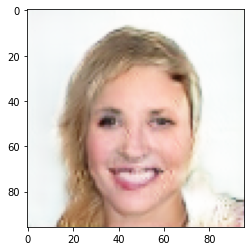

2400
tf.Tensor(0.40483928, shape=(), dtype=float32) tf.Tensor(0.446247, shape=(), dtype=float32)


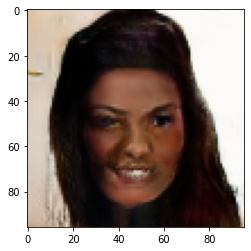

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 30, gen loss=0.4079447090625763,disc loss=0.44025248289108276,
Accuracy:  0.7557628708228442
Accuracy on fake:  0.5994866479095711
800
tf.Tensor(0.42885238, shape=(), dtype=float32) tf.Tensor(0.40985164, shape=(), dtype=float32)


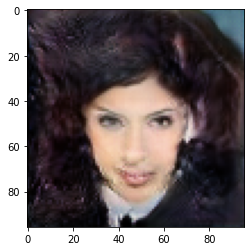

1600
tf.Tensor(0.4354819, shape=(), dtype=float32) tf.Tensor(0.40650943, shape=(), dtype=float32)


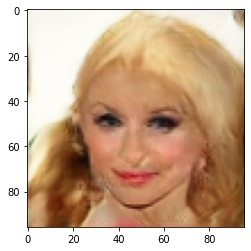

2400
tf.Tensor(0.43816766, shape=(), dtype=float32) tf.Tensor(0.4055834, shape=(), dtype=float32)


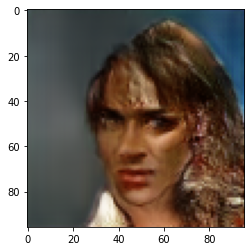

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 31, gen loss=0.4389301538467407,disc loss=0.40585634112358093,
Accuracy:  0.5827533441927045
Accuracy on fake:  0.17049212695592084
800
tf.Tensor(0.45169064, shape=(), dtype=float32) tf.Tensor(0.39922723, shape=(), dtype=float32)


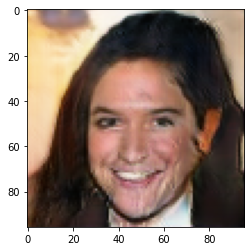

1600
tf.Tensor(0.45532963, shape=(), dtype=float32) tf.Tensor(0.39930737, shape=(), dtype=float32)


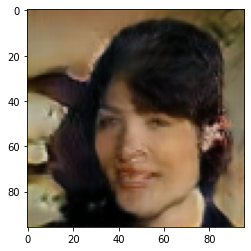

2400
tf.Tensor(0.45109817, shape=(), dtype=float32) tf.Tensor(0.40059718, shape=(), dtype=float32)


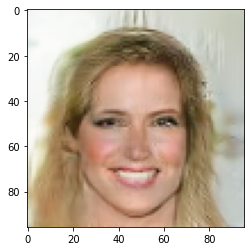

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 32, gen loss=0.45139726996421814,disc loss=0.4004797637462616,
Accuracy:  0.5531862382151143
Accuracy on fake:  0.17636605952909817
800
tf.Tensor(0.44611552, shape=(), dtype=float32) tf.Tensor(0.41390803, shape=(), dtype=float32)


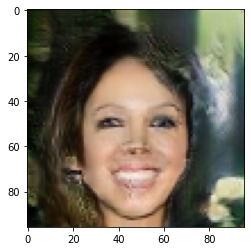

1600
tf.Tensor(0.45054567, shape=(), dtype=float32) tf.Tensor(0.4044403, shape=(), dtype=float32)


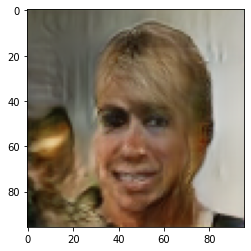

2400
tf.Tensor(0.45162725, shape=(), dtype=float32) tf.Tensor(0.40183458, shape=(), dtype=float32)


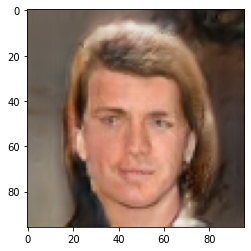

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 33, gen loss=0.4535730481147766,disc loss=0.40058913826942444,
Accuracy:  0.70358852855521
Accuracy on fake:  0.5153758823239054
800
tf.Tensor(0.46226457, shape=(), dtype=float32) tf.Tensor(0.3892303, shape=(), dtype=float32)


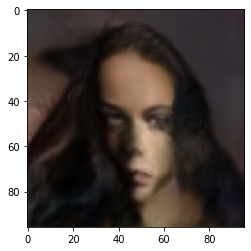

1600
tf.Tensor(0.46605507, shape=(), dtype=float32) tf.Tensor(0.38798496, shape=(), dtype=float32)


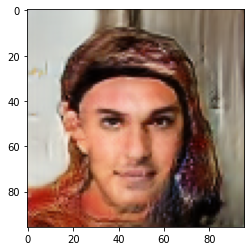

2400
tf.Tensor(0.46592137, shape=(), dtype=float32) tf.Tensor(0.38779238, shape=(), dtype=float32)


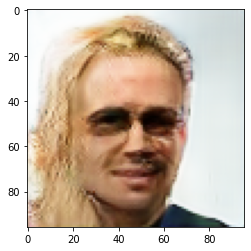

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 34, gen loss=0.46709275245666504,disc loss=0.38808736205101013,
Accuracy:  0.8799792684732711
Accuracy on fake:  0.8842489757638581
800
tf.Tensor(0.4790805, shape=(), dtype=float32) tf.Tensor(0.38045093, shape=(), dtype=float32)


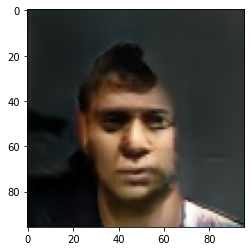

1600
tf.Tensor(0.4789366, shape=(), dtype=float32) tf.Tensor(0.38246572, shape=(), dtype=float32)


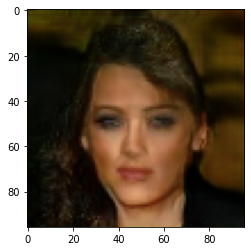

2400
tf.Tensor(0.47968528, shape=(), dtype=float32) tf.Tensor(0.37979794, shape=(), dtype=float32)


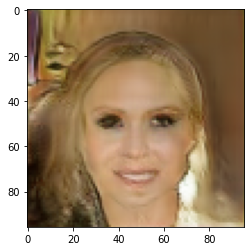

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 35, gen loss=0.4811142086982727,disc loss=0.3788307011127472,
Accuracy:  0.8240781874722346
Accuracy on fake:  0.7202724714941507
800
tf.Tensor(0.49086967, shape=(), dtype=float32) tf.Tensor(0.37162995, shape=(), dtype=float32)


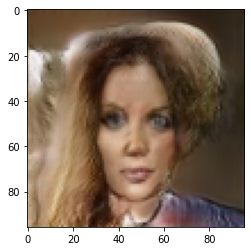

1600
tf.Tensor(0.48896322, shape=(), dtype=float32) tf.Tensor(0.37485278, shape=(), dtype=float32)


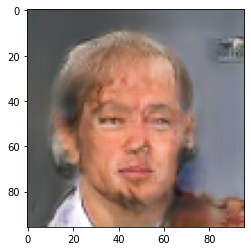

2400
tf.Tensor(0.48952043, shape=(), dtype=float32) tf.Tensor(0.3745386, shape=(), dtype=float32)


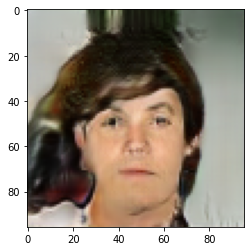

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 36, gen loss=0.48969992995262146,disc loss=0.37365102767944336,
Accuracy:  0.7634384717903154
Accuracy on fake:  0.5447455451897922
800
tf.Tensor(0.49799383, shape=(), dtype=float32) tf.Tensor(0.37047768, shape=(), dtype=float32)


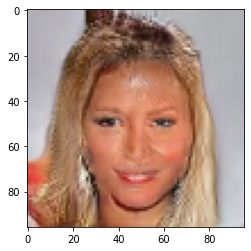

1600
tf.Tensor(0.4962947, shape=(), dtype=float32) tf.Tensor(0.36839658, shape=(), dtype=float32)


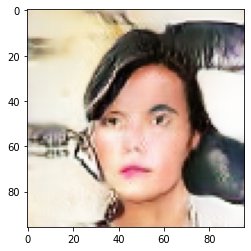

2400
tf.Tensor(0.49854755, shape=(), dtype=float32) tf.Tensor(0.36758232, shape=(), dtype=float32)


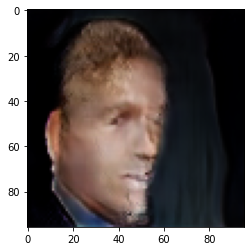

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 37, gen loss=0.49803680181503296,disc loss=0.36690154671669006,
Accuracy:  0.7832074633496224
Accuracy on fake:  0.5870970926501802
800
tf.Tensor(0.50602895, shape=(), dtype=float32) tf.Tensor(0.36073697, shape=(), dtype=float32)


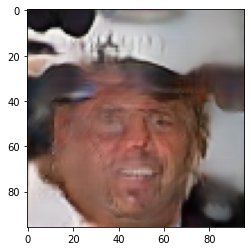

1600
tf.Tensor(0.50623643, shape=(), dtype=float32) tf.Tensor(0.36131626, shape=(), dtype=float32)


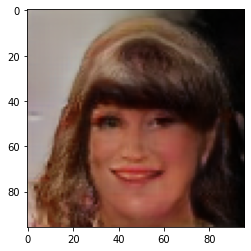

2400
tf.Tensor(0.50706613, shape=(), dtype=float32) tf.Tensor(0.36136612, shape=(), dtype=float32)


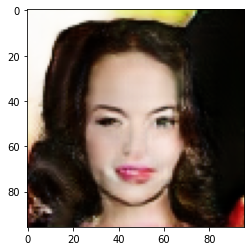

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 38, gen loss=0.5062729120254517,disc loss=0.36124542355537415,
Accuracy:  0.8718100597265412
Accuracy on fake:  0.9070042943876796
800
tf.Tensor(0.5114863, shape=(), dtype=float32) tf.Tensor(0.35761678, shape=(), dtype=float32)


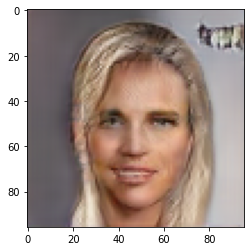

1600
tf.Tensor(0.51482856, shape=(), dtype=float32) tf.Tensor(0.35704395, shape=(), dtype=float32)


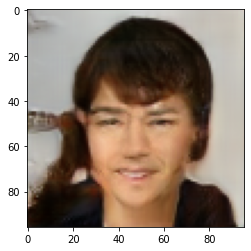

2400
tf.Tensor(0.51404095, shape=(), dtype=float32) tf.Tensor(0.35534078, shape=(), dtype=float32)


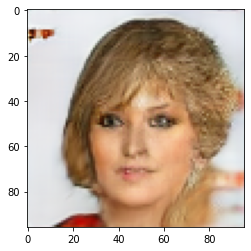

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 39, gen loss=0.514060378074646,disc loss=0.35494306683540344,
Accuracy:  0.6883360481761193
Accuracy on fake:  0.39730490152524806
800
tf.Tensor(0.5261392, shape=(), dtype=float32) tf.Tensor(0.34904653, shape=(), dtype=float32)


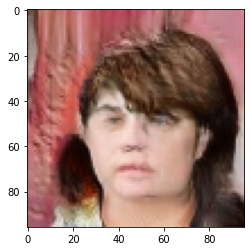

1600
tf.Tensor(0.52209824, shape=(), dtype=float32) tf.Tensor(0.35197124, shape=(), dtype=float32)


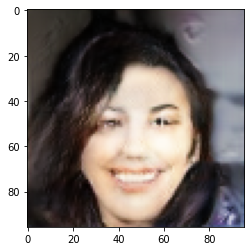

2400
tf.Tensor(0.5213146, shape=(), dtype=float32) tf.Tensor(0.35114348, shape=(), dtype=float32)


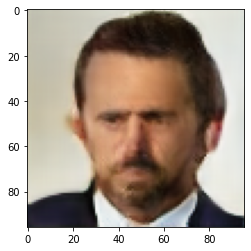

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VLSGAN/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VLSGAN/assets
Epoch 40, gen loss=0.5220000147819519,disc loss=0.35149890184402466,
Accuracy:  0.8267930302581569
Accuracy on fake:  0.679253665037761


In [ ]:
fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
epochs = 40

for epoch in range(epochs):

  gen_loss_list = []
  disc_loss_list = []

  batchNum = 0
  for image_batch in trainData:
    t = train_step(image_batch)
    gen_loss_list.append(t[0])
    disc_loss_list.append(t[1])
    batchNum = batchNum + 1
    if batchNum % 800 == 0:
      print(batchNum)
      print(sum(gen_loss_list) / len(gen_loss_list), sum(disc_loss_list) / len(disc_loss_list))
      noise = tf.random.normal([1, SEED_SIZE])
      generated_image = generator(noise, training=False)
      plt.imshow(generated_image[0])
      #plt.savefig("generatedImage"+str(epoch)+"-"+str(batchNum))
      plt.show()
  
  generator.save("/content/gdrive/MyDrive/generator-VLSGAN")
  discriminator.save("/content/gdrive/MyDrive/discriminator-VLSGAN")
  
  correct = 0
  correct_fake = 0
  totalSize = val_size*2
  for image_batch in valData:
    realVal, fakeVal = val_step(image_batch)
    realVal = realVal.numpy() > 0.5
    fakeVal = fakeVal.numpy() < 0.5
    correct = correct + np.count_nonzero(realVal) + np.count_nonzero(fakeVal)
    correct_fake = correct_fake + np.count_nonzero(fakeVal)

  g_loss = sum(gen_loss_list) / len(gen_loss_list)
  d_loss = sum(disc_loss_list) / len(disc_loss_list)

  print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss},')
  print ("Accuracy: ", 1.0*correct/totalSize)
  print ("Accuracy on fake: ", 1.0*correct_fake/val_size)